Connect Colab to Drive


In [ ]:
#Accessing the data on drive from colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Libraries

In [ ]:
#Importing the necessary libraries
import numpy as np #used to implement complex mathematical operations on arrays/matrices
import matplotlib.pyplot as plt #used for graphs and plots
import os #used to deal with operating systems
from tensorflow import keras #The library used for implementing neural networks
from keras.layers import * #Importing all layers in keras instead of one by one
from keras.models import * #Importing all models in keras instead of one by one
import keras.callbacks #Importing the callbacks function to implement our own callbacks
from tensorflow.keras.preprocessing.image import *
#Importing all functions from keras preprocessing to assist us in Data Augmentation and Data Labeling


Dataset

In [ ]:
train_path ='/content/drive/MyDrive/data/train'
test_path ='/content/drive/MyDrive/data/test'

In [ ]:
#Create an instance of ImageDataGenerator to be used for data labeling and augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, shear_range=0.2,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    validation_split=0.2)
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
#Use ImageDataGenerator for Data Labeling & Augmentation
training_dataset = train_datagen.flow_from_directory(train_path,
                                                     target_size = (224,224),
                                                     batch_size= 32,
                                                     class_mode='categorical')

test_dataset = test_datagen.flow_from_directory(test_path,
                                                target_size = (224,224),
                                                batch_size = 32,
                                                class_mode='categorical')

Found 2774 images belonging to 5 classes.
Found 694 images belonging to 5 classes.


In [ ]:
#Getting Classes Indices
training_dataset.class_indices

{'gun': 0, 'key': 1, 'knife': 2, 'razor': 3, 'sharb tool': 4}

In [ ]:
#Implement callbacks, Stop the training if the model reaches 60% Accuracy.
class myCallback(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if (logs.get('accuracy') == 0.80):
      print('Accuracy is 99%, training will be stopped.')
      self.model.stop_training = True



callbacks = myCallback()


Model Building

In [ ]:
#Implement the Neural Network

model = Sequential()
model.add(Conv2D(128, (3,3), activation='relu', input_shape=(224,224,1)))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size = 2))

model.add(Conv2D(128, (3,3), activation='relu'))
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size = 2))

model.add(Conv2D(256, (3,3), activation='relu'))
model.add(Conv2D(256, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size = 2))

model.add(Conv2D(512, (3,3), activation='relu'))
model.add(Conv2D(512, (3,3), activation='relu'))
model.add(Conv2D(512, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size = 2))

model.add(Conv2D(512, (3,3), activation='relu'))
model.add(Conv2D(512, (3,3), activation='relu'))
model.add(Conv2D(512, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size = 2))



model.add(Flatten())

model.add(Dense(200, activation='relu'))
model.add(Dense(200, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(5, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 64)      73792     
                                                                 
 conv2d_2 (Conv2D)           (None, 218, 218, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 64)      0         
 D)                                                              
                                                                 
 conv2d_3 (Conv2D)           (None, 107, 107, 128)     73856     
                                                                 
 conv2d_4 (Conv2D)           (None, 105, 105, 128)     147584    
                                                        

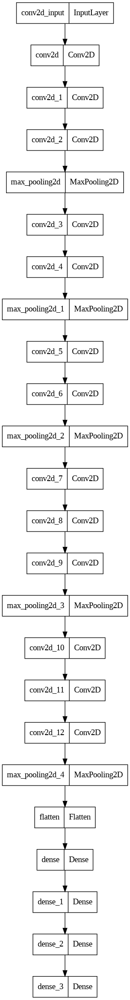

In [ ]:
import keras.utils
keras.utils.plot_model(model,to_file='model_architecture.png', show_layer_names=True)

In [ ]:
from PIL import Image
input_path='/content/graph01.png'
#read the image
im = Image.open(input_path)
#show image
im

FileNotFoundError: ignored

In [ ]:
#Try different optimizers to decicde which one will be better using website https://keras.io/api/optimizers/ from keras
opts = ['adam','RMSprop']
accuracies = []
val_accuracies = []
for opt in opts:
  model.compile(loss='categorical_crossentropy',optimizer= opt ,metrics=['accuracy'])
 #Fit the model
  hist = model.fit_generator(
    training_dataset,
    steps_per_epoch=10,
    epochs = 15,
    validation_data = test_dataset,
    validation_steps=2 )
  K = np.array(model.evaluate_generator(training_dataset))
  accuracies.append(K[1])
  print(K)
  L= model.evaluate_generator(test_dataset)
  val_accuracies.append(L[1])
  print(L)

<ipython-input-12-854ce8079486>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist = model.fit_generator(


Epoch 1/15
10/10 [==============================] - 135s 11s/step - loss: 1.5372 - accuracy: 0.4563 - val_loss: 1.5581 - val_accuracy: 0.1094
Epoch 2/15
10/10 [==============================] - 112s 11s/step - loss: 1.5266 - accuracy: 0.5719 - val_loss: 1.3961 - val_accuracy: 0.6250
Epoch 3/15
10/10 [==============================] - 96s 10s/step - loss: 1.3308 - accuracy: 0.6500 - val_loss: 1.3233 - val_accuracy: 0.6250
Epoch 4/15
10/10 [==============================] - 80s 8s/step - loss: 1.2911 - accuracy: 0.6531 - val_loss: 1.1943 - val_accuracy: 0.6094
Epoch 5/15
10/10 [==============================] - 74s 8s/step - loss: 1.1918 - accuracy: 0.5844 - val_loss: 1.2280 - val_accuracy: 0.5312
Epoch 6/15
10/10 [==============================] - 66s 7s/step - loss: 1.2102 - accuracy: 0.5375 - val_loss: 1.0364 - val_accuracy: 0.6250
Epoch 7/15
10/10 [==============================] - 59s 6s/step - loss: 1.1205 - accuracy: 0.6094 - val_loss: 1.2208 - val_accuracy: 0.5156
Epoch 8/15
10/1

<ipython-input-12-854ce8079486>:14: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  K = np.array(model.evaluate_generator(training_dataset))


[1.14632785 0.6045422 ]


<ipython-input-12-854ce8079486>:17: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  L= model.evaluate_generator(test_dataset)


[1.1625370979309082, 0.5936599373817444]
Epoch 1/15
10/10 [==============================] - 24s 2s/step - loss: 1.1053 - accuracy: 0.6258 - val_loss: 0.9819 - val_accuracy: 0.6250
Epoch 2/15
10/10 [==============================] - 20s 2s/step - loss: 1.0776 - accuracy: 0.6406 - val_loss: 0.8564 - val_accuracy: 0.7188
Epoch 3/15
10/10 [==============================] - 18s 2s/step - loss: 0.8579 - accuracy: 0.6812 - val_loss: 0.7759 - val_accuracy: 0.7656
Epoch 4/15
10/10 [==============================] - 17s 2s/step - loss: 0.9421 - accuracy: 0.6562 - val_loss: 0.9418 - val_accuracy: 0.5312
Epoch 5/15
10/10 [==============================] - 21s 2s/step - loss: 0.9125 - accuracy: 0.6344 - val_loss: 0.8181 - val_accuracy: 0.7812
Epoch 6/15
10/10 [==============================] - 19s 2s/step - loss: 0.6957 - accuracy: 0.7844 - val_loss: 0.6593 - val_accuracy: 0.7812
Epoch 7/15
10/10 [==============================] - 20s 2s/step - loss: 0.9398 - accuracy: 0.6531 - val_loss: 0.7987 - 

<Figure size 640x480 with 0 Axes>

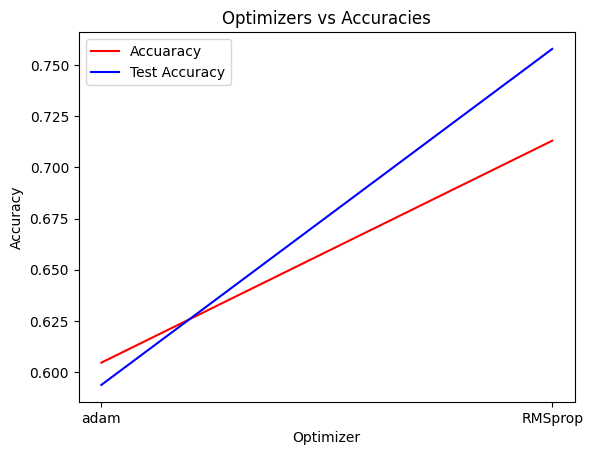

<Figure size 640x480 with 0 Axes>

In [ ]:
# Plot Optimizers vs Accuracy
plt.plot(opts, accuracies, 'r')
plt.plot(opts, val_accuracies, 'b')
plt.title('Optimizers vs Accuracies')
plt.legend(['Accuaracy', 'Test Accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Optimizer')
plt.figure()

In [ ]:
#Getting the model ready for training
model.compile(optimizer ='adam'
              , loss= 'categorical_crossentropy'
              , metrics=['accuracy'])

In [ ]:
history = model.fit_generator(training_dataset, epochs = 25
                              , steps_per_epoch = 10 ,
                    validation_data = test_dataset,
                              validation_steps = 2, callbacks=[callbacks], verbose = 1)

<ipython-input-139-4f4345d38216>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(training_dataset, epochs = 25


Epoch 1/25
10/10 [==============================] - 450s 44s/step - loss: 5.9985 - accuracy: 0.5063 - val_loss: 1.4904 - val_accuracy: 0.7344
Epoch 2/25
10/10 [==============================] - 422s 42s/step - loss: 1.2231 - accuracy: 0.6250 - val_loss: 1.1840 - val_accuracy: 0.5938
Epoch 3/25
10/10 [==============================] - 436s 43s/step - loss: 1.1934 - accuracy: 0.5875 - val_loss: 1.0294 - val_accuracy: 0.6562
Epoch 4/25
10/10 [==============================] - 433s 43s/step - loss: 1.1216 - accuracy: 0.6094 - val_loss: 1.0516 - val_accuracy: 0.7031
Epoch 5/25
10/10 [==============================] - 426s 42s/step - loss: 1.1618 - accuracy: 0.5969 - val_loss: 1.2141 - val_accuracy: 0.5312
Epoch 6/25
10/10 [==============================] - 426s 42s/step - loss: 1.1171 - accuracy: 0.6062 - val_loss: 1.0794 - val_accuracy: 0.6094
Epoch 7/25
10/10 [==============================] - 399s 40s/step - loss: 1.1167 - accuracy: 0.6250 - val_loss: 1.1330 - val_accuracy: 0.5781
Epoch 

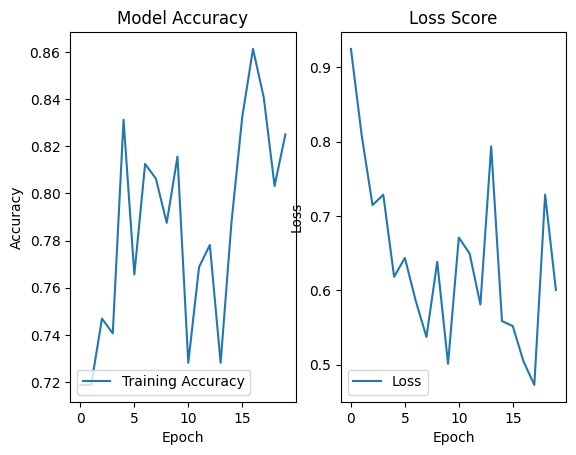

In [ ]:
#Plotting Model Training Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training Accuracy'], loc='lower left')

#Plotting Model Training Loss
plt.subplot(1,2, 2)
plt.plot(history.history['loss'])
plt.title('Loss Score')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Loss'], loc='lower left')

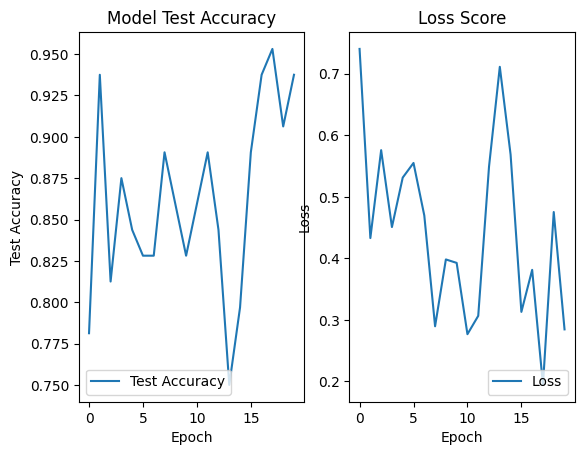

In [ ]:
#Plotting Model Test Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['val_accuracy'])
plt.title('Model Test Accuracy')
plt.ylabel('Test Accuracy')
plt.xlabel('Epoch')
plt.legend(['Test Accuracy'], loc='lower left')

#Plotting Model Test Loss
plt.subplot(1,2, 2)
plt.plot(history.history['val_loss'])
plt.title('Loss Score')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Loss'], loc='lower right')

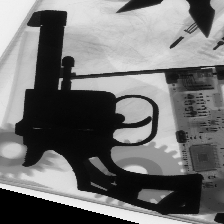

1/1 [==============================] - 2s 2s/step
Predicted: sharp blade tool


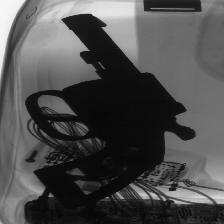

1/1 [==============================] - 0s 34ms/step
Predicted: sharp blade tool


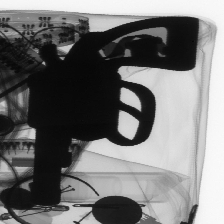

1/1 [==============================] - 0s 64ms/step
Predicted: sharp blade tool


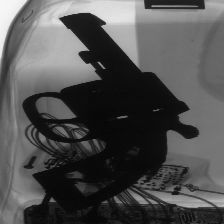

1/1 [==============================] - 0s 131ms/step
Predicted: sharp blade tool


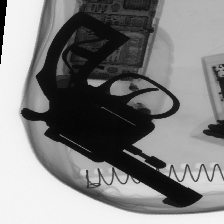

1/1 [==============================] - 0s 113ms/step
Predicted: sharp blade tool


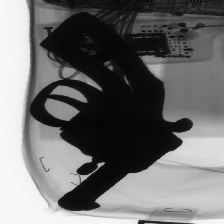

1/1 [==============================] - 0s 41ms/step
Predicted: sharp blade tool


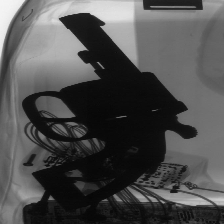

1/1 [==============================] - 0s 42ms/step
Predicted: sharp blade tool


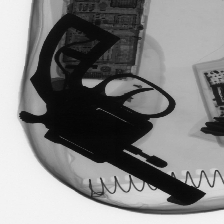

1/1 [==============================] - 0s 35ms/step
Predicted: sharp blade tool


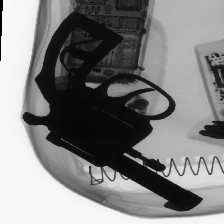

1/1 [==============================] - 0s 73ms/step
Predicted: sharp blade tool


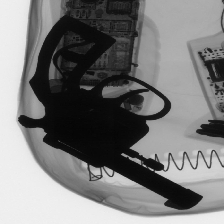

1/1 [==============================] - 0s 47ms/step
Predicted: sharp blade tool


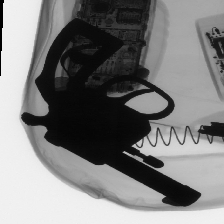

1/1 [==============================] - 0s 20ms/step
Predicted: sharp blade tool


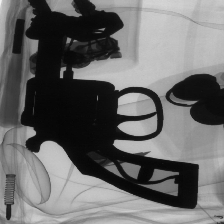

1/1 [==============================] - 0s 23ms/step
Predicted: sharp blade tool


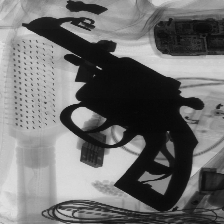

1/1 [==============================] - 0s 19ms/step
Predicted: sharp blade tool


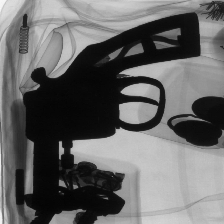

1/1 [==============================] - 0s 18ms/step
Predicted: sharp blade tool


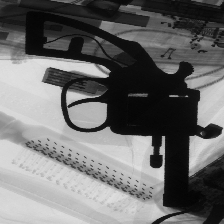

1/1 [==============================] - 0s 18ms/step
Predicted: sharp blade tool


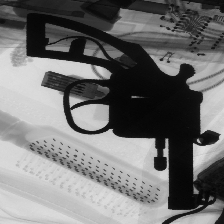

1/1 [==============================] - 0s 20ms/step
Predicted: sharp blade tool


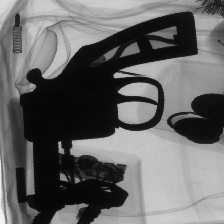

1/1 [==============================] - 0s 20ms/step
Predicted: sharp blade tool


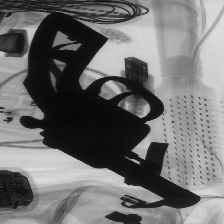

1/1 [==============================] - 0s 21ms/step
Predicted: sharp blade tool


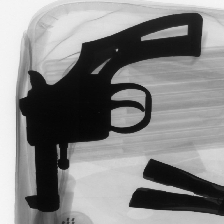

1/1 [==============================] - 0s 20ms/step
Predicted: sharp blade tool


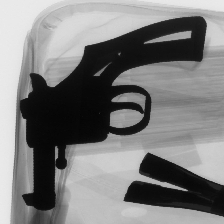

1/1 [==============================] - 0s 39ms/step
Predicted: sharp blade tool


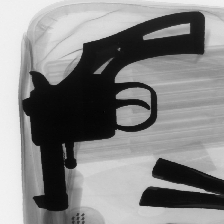

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


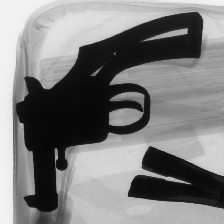

1/1 [==============================] - 0s 29ms/step
Predicted: sharp blade tool


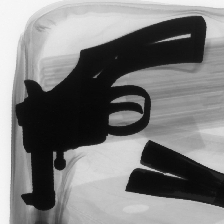

1/1 [==============================] - 0s 35ms/step
Predicted: sharp blade tool


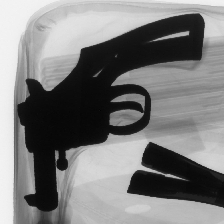

1/1 [==============================] - 0s 34ms/step
Predicted: sharp blade tool


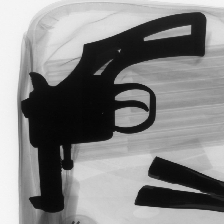

1/1 [==============================] - 0s 36ms/step
Predicted: sharp blade tool


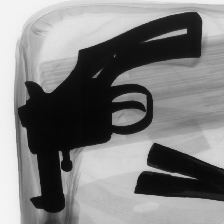

1/1 [==============================] - 0s 41ms/step
Predicted: sharp blade tool


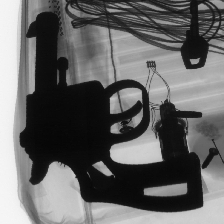

1/1 [==============================] - 0s 27ms/step
Predicted: sharp blade tool


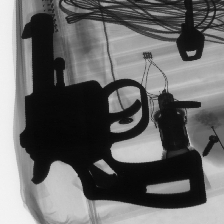

1/1 [==============================] - 0s 33ms/step
Predicted: sharp blade tool


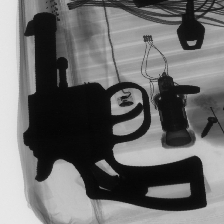

1/1 [==============================] - 0s 29ms/step
Predicted: sharp blade tool


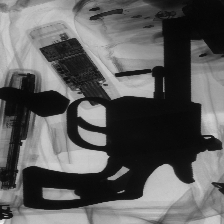

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


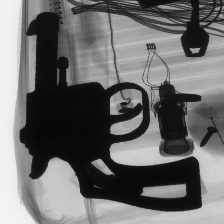

1/1 [==============================] - 0s 29ms/step
Predicted: sharp blade tool


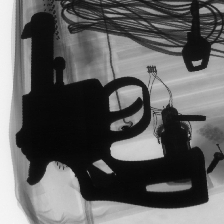

1/1 [==============================] - 0s 43ms/step
Predicted: sharp blade tool


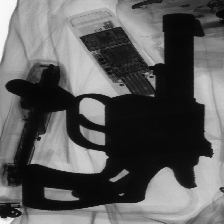

1/1 [==============================] - 0s 51ms/step
Predicted: sharp blade tool


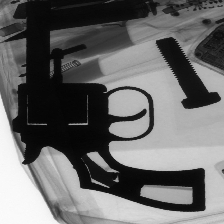

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


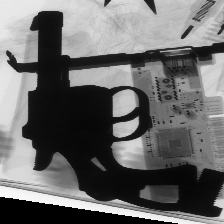

1/1 [==============================] - 0s 41ms/step
Predicted: sharp blade tool


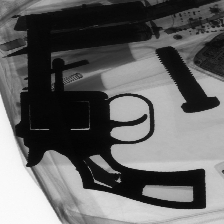

1/1 [==============================] - 0s 44ms/step
Predicted: sharp blade tool


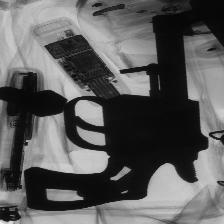

1/1 [==============================] - 0s 40ms/step
Predicted: sharp blade tool


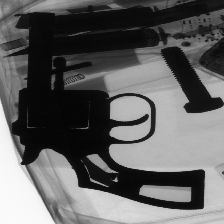

1/1 [==============================] - 0s 39ms/step
Predicted: sharp blade tool


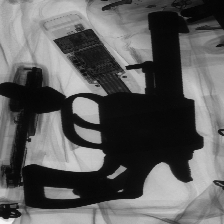

1/1 [==============================] - 0s 33ms/step
Predicted: sharp blade tool


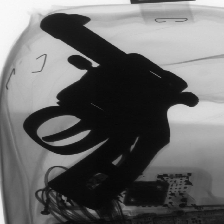

1/1 [==============================] - 0s 36ms/step
Predicted: sharp blade tool


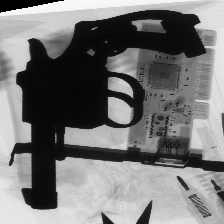

1/1 [==============================] - 0s 29ms/step
Predicted: sharp blade tool


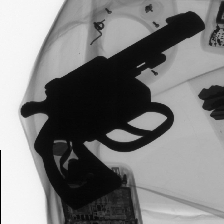

1/1 [==============================] - 0s 32ms/step
Predicted: sharp blade tool


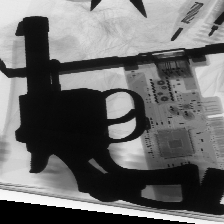

1/1 [==============================] - 0s 41ms/step
Predicted: sharp blade tool


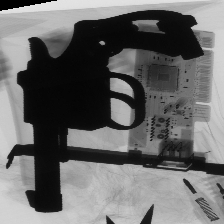

1/1 [==============================] - 0s 49ms/step
Predicted: sharp blade tool


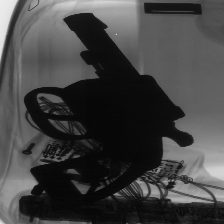

1/1 [==============================] - 0s 43ms/step
Predicted: sharp blade tool


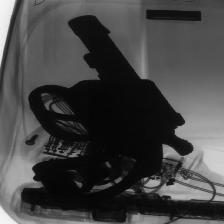

1/1 [==============================] - 0s 36ms/step
Predicted: sharp blade tool


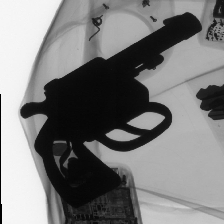

1/1 [==============================] - 0s 47ms/step
Predicted: sharp blade tool


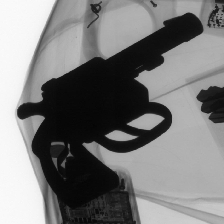

1/1 [==============================] - 0s 35ms/step
Predicted: sharp blade tool


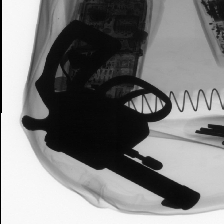

1/1 [==============================] - 0s 43ms/step
Predicted: sharp blade tool


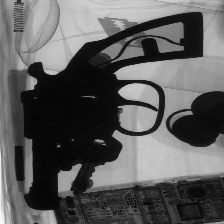

1/1 [==============================] - 0s 27ms/step
Predicted: sharp blade tool


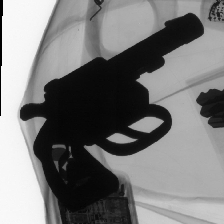

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


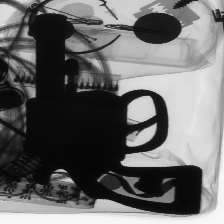

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


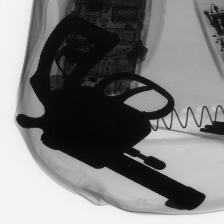

1/1 [==============================] - 0s 57ms/step
Predicted: sharp blade tool


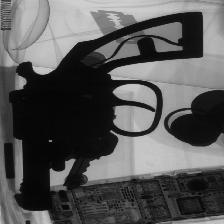

1/1 [==============================] - 0s 39ms/step
Predicted: knife


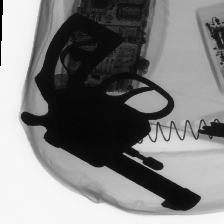

1/1 [==============================] - 0s 43ms/step
Predicted: sharp blade tool


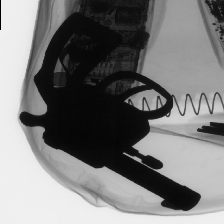

1/1 [==============================] - 0s 33ms/step
Predicted: sharp blade tool


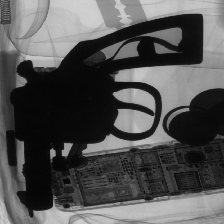

1/1 [==============================] - 0s 44ms/step
Predicted: sharp blade tool


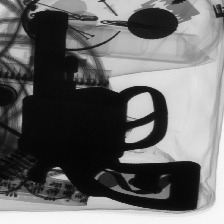

1/1 [==============================] - 0s 67ms/step
Predicted: sharp blade tool


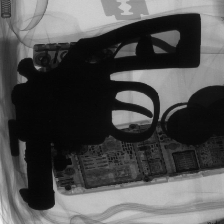

1/1 [==============================] - 0s 45ms/step
Predicted: sharp blade tool


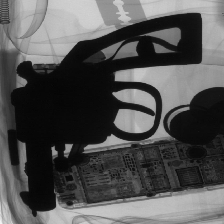

1/1 [==============================] - 0s 32ms/step
Predicted: sharp blade tool


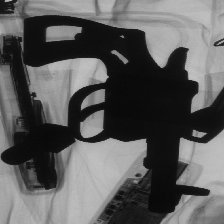

1/1 [==============================] - 0s 31ms/step
Predicted: sharp blade tool


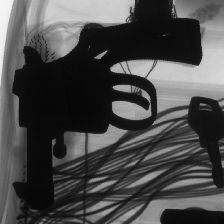

1/1 [==============================] - 0s 36ms/step
Predicted: sharp blade tool


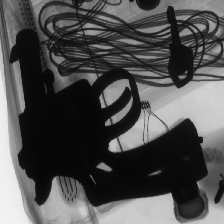

1/1 [==============================] - 0s 41ms/step
Predicted: sharp blade tool


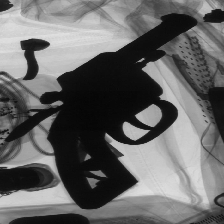

1/1 [==============================] - 0s 32ms/step
Predicted: sharp blade tool


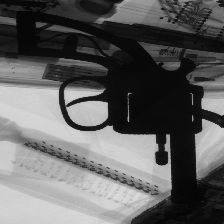

1/1 [==============================] - 0s 27ms/step
Predicted: sharp blade tool


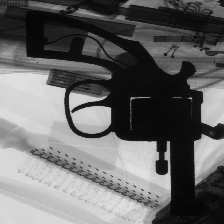

1/1 [==============================] - 0s 29ms/step
Predicted: sharp blade tool


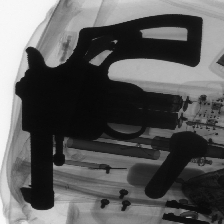

1/1 [==============================] - 0s 41ms/step
Predicted: sharp blade tool


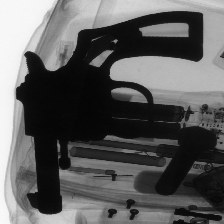

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


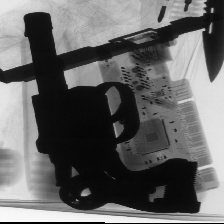

1/1 [==============================] - 0s 50ms/step
Predicted: sharp blade tool


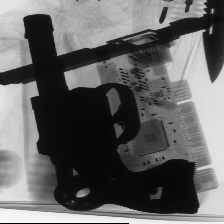

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


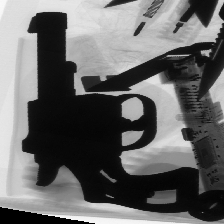

1/1 [==============================] - 0s 38ms/step
Predicted: sharp blade tool


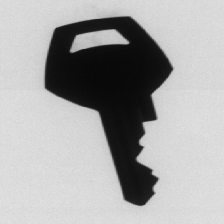

1/1 [==============================] - 0s 28ms/step
Predicted: sharp blade tool


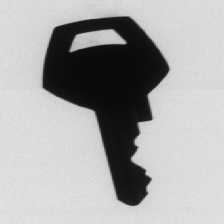

1/1 [==============================] - 0s 30ms/step
Predicted: sharp blade tool


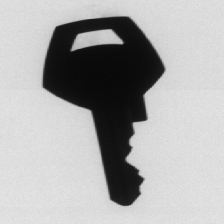

1/1 [==============================] - 0s 30ms/step
Predicted: knife


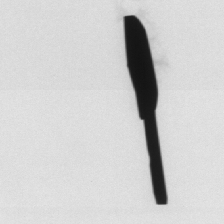

1/1 [==============================] - 0s 30ms/step
Predicted: knife


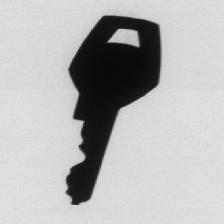

1/1 [==============================] - 0s 28ms/step
Predicted: knife


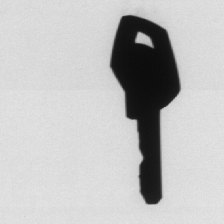

1/1 [==============================] - 0s 32ms/step
Predicted: knife


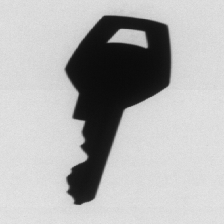

1/1 [==============================] - 0s 28ms/step
Predicted: knife


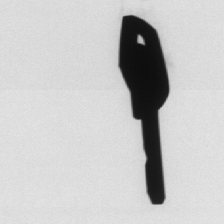

1/1 [==============================] - 0s 32ms/step
Predicted: knife


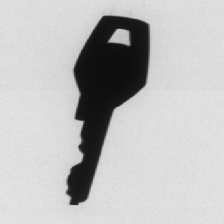

1/1 [==============================] - 0s 26ms/step
Predicted: knife


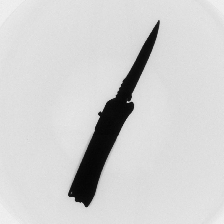

1/1 [==============================] - 0s 32ms/step
Predicted: knife


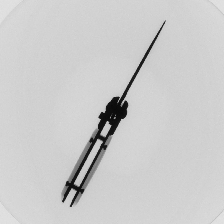

1/1 [==============================] - 0s 29ms/step
Predicted: knife


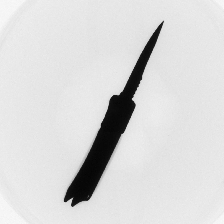

1/1 [==============================] - 0s 37ms/step
Predicted: knife


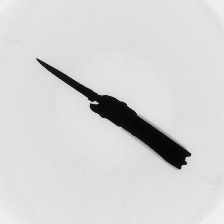

1/1 [==============================] - 0s 33ms/step
Predicted: knife


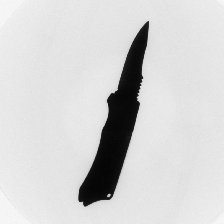

1/1 [==============================] - 0s 87ms/step
Predicted: knife


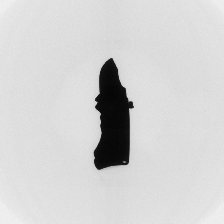

1/1 [==============================] - 0s 34ms/step
Predicted: knife


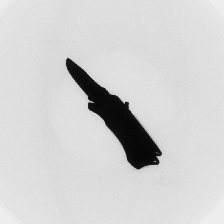

1/1 [==============================] - 0s 30ms/step
Predicted: knife


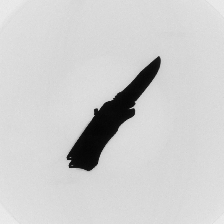

1/1 [==============================] - 0s 29ms/step
Predicted: knife


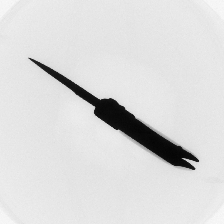

1/1 [==============================] - 0s 32ms/step
Predicted: knife


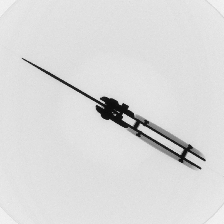

1/1 [==============================] - 0s 29ms/step
Predicted: knife


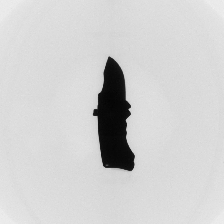

1/1 [==============================] - 0s 28ms/step
Predicted: knife


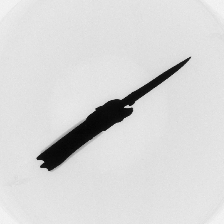

1/1 [==============================] - 0s 31ms/step
Predicted: knife


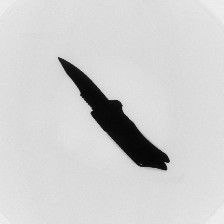

1/1 [==============================] - 0s 33ms/step
Predicted: knife


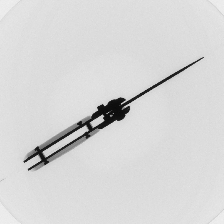

1/1 [==============================] - 0s 31ms/step
Predicted: knife


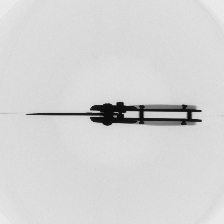

1/1 [==============================] - 0s 28ms/step
Predicted: knife


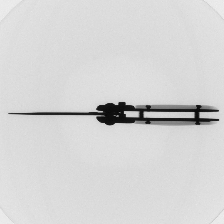

1/1 [==============================] - 0s 27ms/step
Predicted: knife


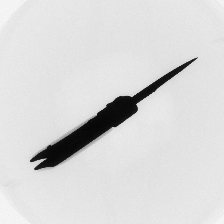

1/1 [==============================] - 0s 29ms/step
Predicted: knife


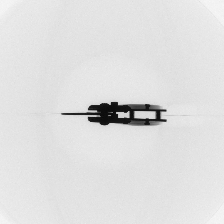

1/1 [==============================] - 0s 27ms/step
Predicted: sharp blade tool


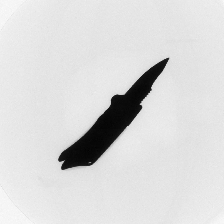

1/1 [==============================] - 0s 30ms/step
Predicted: knife


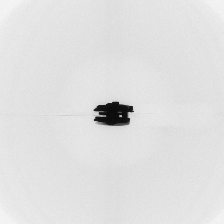

1/1 [==============================] - 0s 30ms/step
Predicted: knife


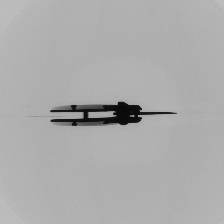

1/1 [==============================] - 0s 31ms/step
Predicted: knife


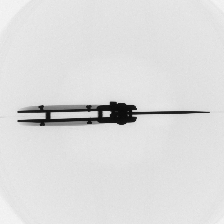

1/1 [==============================] - 0s 27ms/step
Predicted: knife


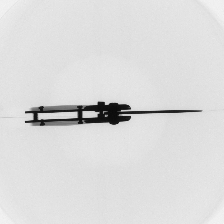

1/1 [==============================] - 0s 29ms/step
Predicted: knife


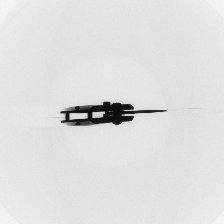

1/1 [==============================] - 0s 29ms/step
Predicted: knife


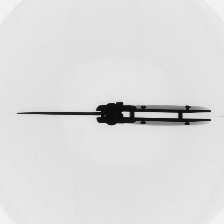

1/1 [==============================] - 0s 38ms/step
Predicted: knife


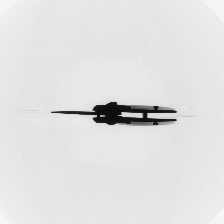

1/1 [==============================] - 0s 30ms/step
Predicted: knife


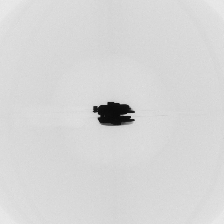

1/1 [==============================] - 0s 32ms/step
Predicted: knife


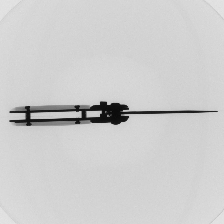

1/1 [==============================] - 0s 27ms/step
Predicted: knife


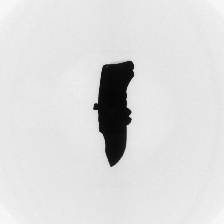

1/1 [==============================] - 0s 28ms/step
Predicted: knife


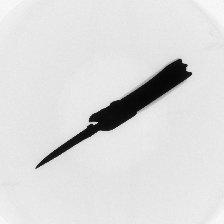

1/1 [==============================] - 0s 29ms/step
Predicted: knife


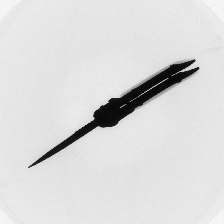

1/1 [==============================] - 0s 27ms/step
Predicted: knife


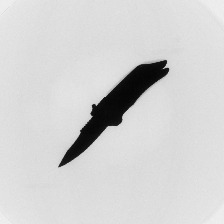

1/1 [==============================] - 0s 29ms/step
Predicted: knife


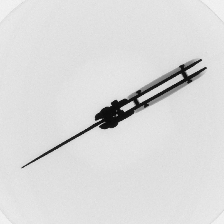

1/1 [==============================] - 0s 29ms/step
Predicted: knife


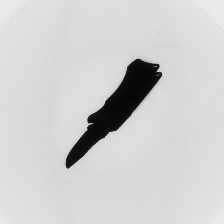

1/1 [==============================] - 0s 30ms/step
Predicted: knife


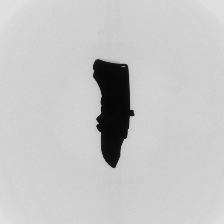

1/1 [==============================] - 0s 27ms/step
Predicted: knife


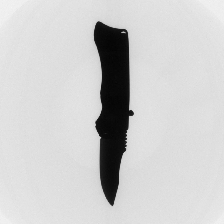

1/1 [==============================] - 0s 30ms/step
Predicted: knife


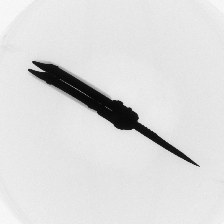

1/1 [==============================] - 0s 33ms/step
Predicted: knife


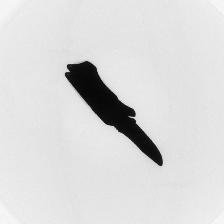

1/1 [==============================] - 0s 28ms/step
Predicted: knife


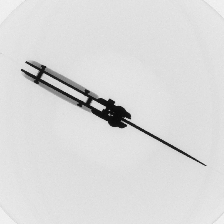

1/1 [==============================] - 0s 32ms/step
Predicted: knife


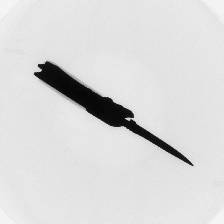

1/1 [==============================] - 0s 33ms/step
Predicted: knife


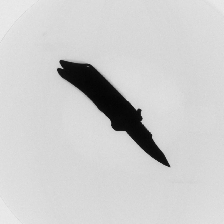

1/1 [==============================] - 0s 29ms/step
Predicted: knife


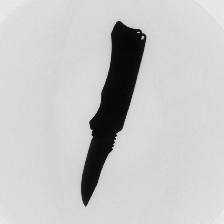

1/1 [==============================] - 0s 34ms/step
Predicted: knife


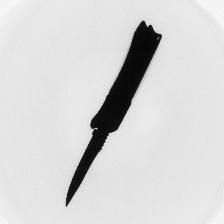

1/1 [==============================] - 0s 33ms/step
Predicted: knife


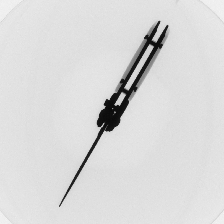

1/1 [==============================] - 0s 29ms/step
Predicted: knife


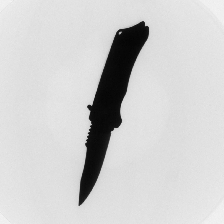

1/1 [==============================] - 0s 39ms/step
Predicted: knife


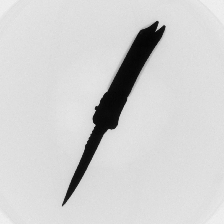

1/1 [==============================] - 0s 44ms/step
Predicted: knife


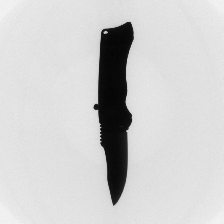

1/1 [==============================] - 0s 31ms/step
Predicted: knife


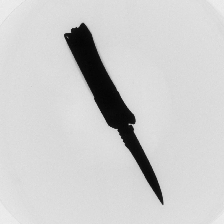

1/1 [==============================] - 0s 29ms/step
Predicted: knife


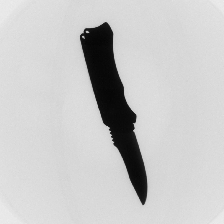

1/1 [==============================] - 0s 31ms/step
Predicted: knife


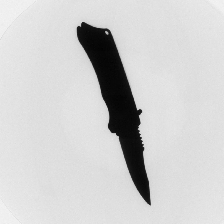

1/1 [==============================] - 0s 28ms/step
Predicted: knife


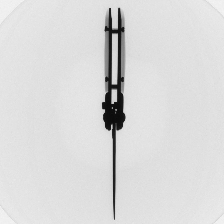

1/1 [==============================] - 0s 34ms/step
Predicted: knife


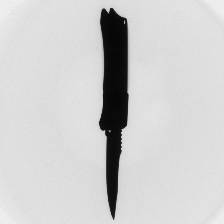

1/1 [==============================] - 0s 39ms/step
Predicted: knife


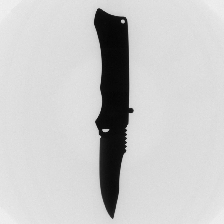

1/1 [==============================] - 0s 39ms/step
Predicted: knife


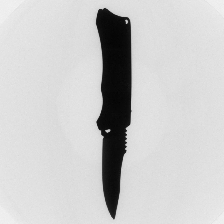

1/1 [==============================] - 0s 34ms/step
Predicted: knife


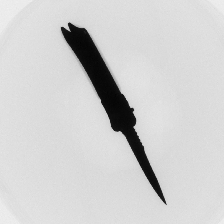

1/1 [==============================] - 0s 32ms/step
Predicted: knife


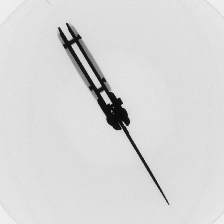

1/1 [==============================] - 0s 39ms/step
Predicted: knife


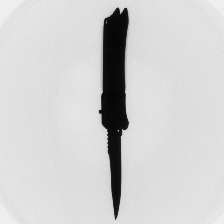

1/1 [==============================] - 0s 27ms/step
Predicted: knife


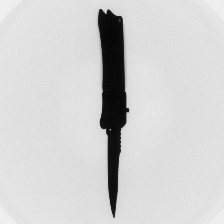

1/1 [==============================] - 0s 39ms/step
Predicted: knife


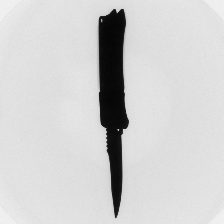

1/1 [==============================] - 0s 37ms/step
Predicted: knife


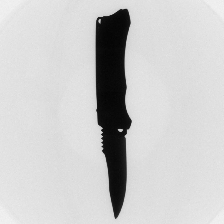

1/1 [==============================] - 0s 56ms/step
Predicted: knife


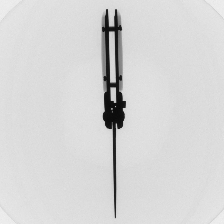

1/1 [==============================] - 0s 30ms/step
Predicted: knife


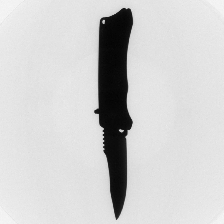

1/1 [==============================] - 0s 31ms/step
Predicted: knife


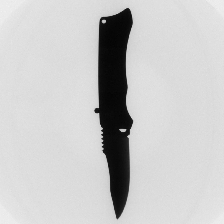

1/1 [==============================] - 0s 39ms/step
Predicted: knife


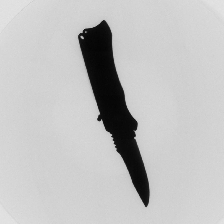

KeyboardInterrupt: ignored

In [ ]:
#Get Results

from keras.src.utils.image_utils import img_to_array
#Results
actual = []
predictions = []

CATEGORIES=["gun", "key", "knife", "razor", "sharp blade tool"]
from google.colab.patches import cv2_imshow


for i in os.listdir("/content/drive/MyDrive/data/test/gun/"):
  image = load_img("/content/drive/MyDrive/data/test/gun/"+i,target_size=(224,224))
  image = img_to_array(image)
  cv2_imshow(image)
  image = np.expand_dims(image, axis=0)
  p = (model.predict(image) > 0.5).astype('int32')
  predicted_class = p.argmax()
  predictions.append(predicted_class)
  actual.append(0)
  print("Predicted:", CATEGORIES[predicted_class])



for i in os.listdir("/content/drive/MyDrive/data/test/key/"):
  image = load_img("/content/drive/MyDrive/data/test/key/"+i,target_size=(224,224))
  image = img_to_array(image)
  cv2_imshow(image)
  image = np.expand_dims(image, axis=0)
  p = (model.predict(image) > 0.5).astype('int32')
  predicted_class = p.argmax()
  predictions.append(predicted_class)
  actual.append(0)
  print("Predicted:", CATEGORIES[predicted_class])


for i in os.listdir("/content/drive/MyDrive/data/test/knife/"):
  image = load_img("/content/drive/MyDrive/data/test/knife/"+i,target_size=(224,224))
  image = img_to_array(image)
  cv2_imshow(image)
  image = np.expand_dims(image, axis=0)
  p = (model.predict(image) > 0.5).astype('int32')
  predicted_class = p.argmax()
  predictions.append(predicted_class)
  actual.append(0)
  print("Predicted:", CATEGORIES[predicted_class])


for i in os.listdir("/content/drive/MyDrive/data/test/razor/"):
  image = load_img("/content/drive/MyDrive/data/test/razor/"+i,target_size=(224,224))
  image = img_to_array(image)
  cv2_imshow(image)
  image = np.expand_dims(image, axis=0)
  p = (model.predict(image) > 0.5).astype('int32')
  predicted_class = p.argmax()
  predictions.append(predicted_class)
  actual.append(0)
  print("Predicted:", CATEGORIES[predicted_class])


for i in os.listdir("/content/drive/MyDrive/data/test/sharb tool/"):
  image = load_img("/content/drive/MyDrive/data/test/sharb tool/"+i,target_size=(224,224))
  image = img_to_array(image)
  cv2_imshow(image)
  image = np.expand_dims(image, axis=0)
  p = (model.predict(image) > 0.5).astype('int32')
  predicted_class = p.argmax()
  predictions.append(predicted_class)
  actual.append(0)
  print("Predicted:", CATEGORIES[predicted_class])

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     143.0
           2       0.00      0.00      0.00       0.0
           4       0.00      0.00      0.00       0.0

    accuracy                           0.00     143.0
   macro avg       0.00      0.00      0.00     143.0
weighted avg       0.00      0.00      0.00     143.0



<Axes: >

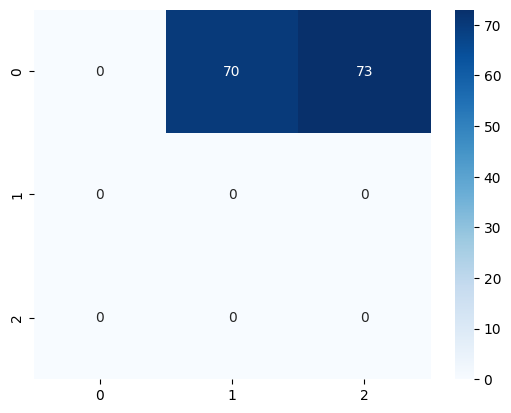

In [ ]:
#Visualize the Results
from sklearn.metrics import confusion_matrix, classification_report
print(classification_report(actual, predictions))

import seaborn as sns
actual = np.array(actual)
predictions = np.array(predictions)

confmatrix = confusion_matrix(actual, predictions)
sns.heatmap(confmatrix,cmap="Blues",annot=True)

In [ ]:
import cv2
import sys

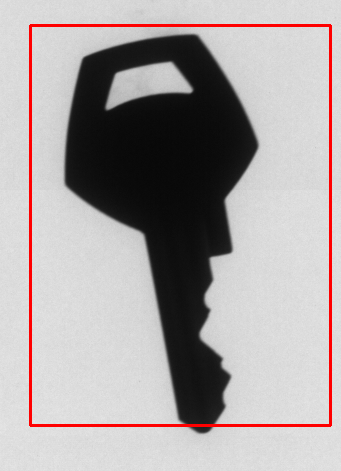

In [ ]:
import cv2 as cv
import numpy as np


# assuming you have the code for opening and processing the image
# here is a sample image for testingp
image = cv.imread('/content/drive/MyDrive/data/test/key/B0074_0011.png')

if image is None:
    print("Error: Unable to open the image.")
elif np.any(np.array(image.shape) <= 0):
    print("Error: Invalid image dimensions.")
else:
   # Define the bounding box coordinates (x, y, width, height)
    x = 30
    y = 25

    width = 300
    height = 400

    # Draw the bounding box on the image
    cv.rectangle(image, (x, y), (x + width, y + height), (0, 0, 255), 2)

from google.colab.patches import cv2_imshow
cv2_imshow(image)
cv.waitKey(0)
cv.destroyAllWindows()

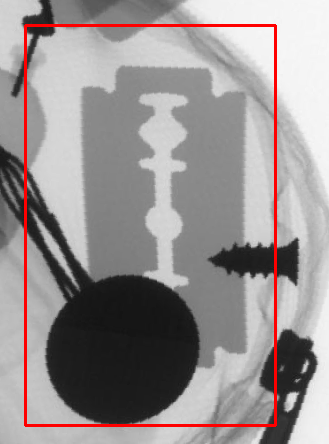

In [ ]:
import cv2 as cv
import numpy as np


# assuming you have the code for opening and processing the image
# here is a sample image for testingp
image = cv.imread('/content/drive/MyDrive/data/test/razor/B0081_0094.png')

if image is None:
    print("Error: Unable to open the image.")
elif np.any(np.array(image.shape) <= 0):
    print("Error: Invalid image dimensions.")
else:
   # Define the bounding box coordinates (x, y, width, height)
    x = 25
    y = 25

    width = 250
    height = 400

    # Draw the bounding box on the image
    cv.rectangle(image, (x, y), (x + width, y + height), (0, 0, 255), 2)

from google.colab.patches import cv2_imshow
cv2_imshow(image)
cv.waitKey(0)
cv.destroyAllWindows()

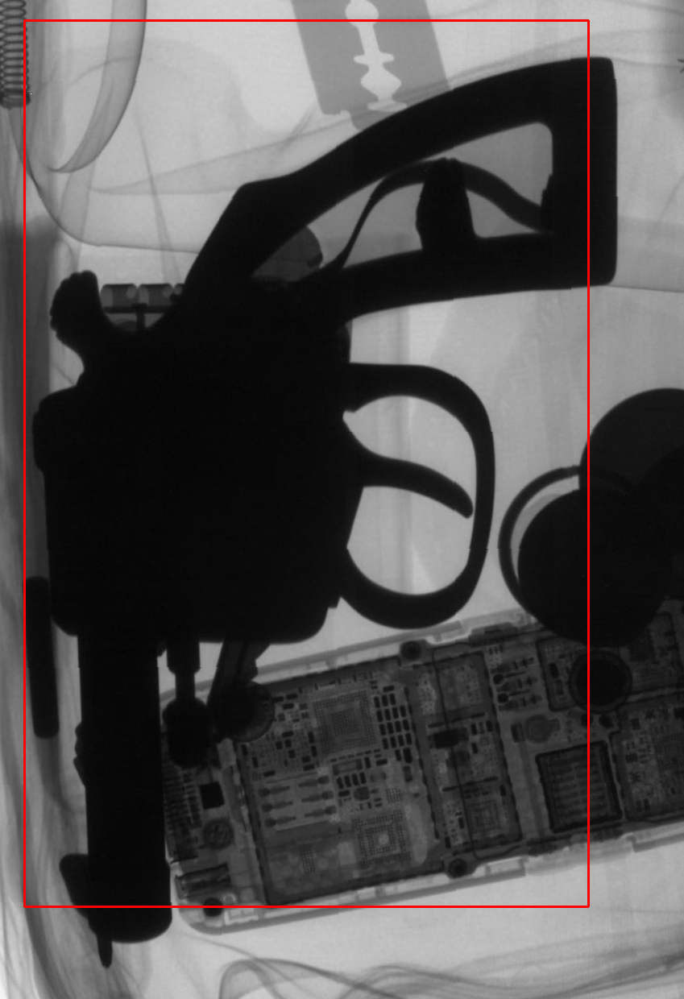

In [ ]:
import cv2 as cv
import numpy as np


# assuming you have the code for opening and processing the image
# here is a sample image for testingp
image = cv.imread('/content/drive/MyDrive/data/test/gun/B0079_0138.png')

if image is None:
    print("Error: Unable to open the image.")
elif np.any(np.array(image.shape) <= 0):
    print("Error: Invalid image dimensions.")
else:
   # Define the bounding box coordinates (x, y, width, height)
    x = 30
    y = 25

    width = 700
    height = 1100

    # Draw the bounding box on the image
    cv.rectangle(image, (x, y), (x + width, y + height), (0, 0, 255), 2)

from google.colab.patches import cv2_imshow
cv2_imshow(image)
cv.waitKey(0)
cv.destroyAllWindows()

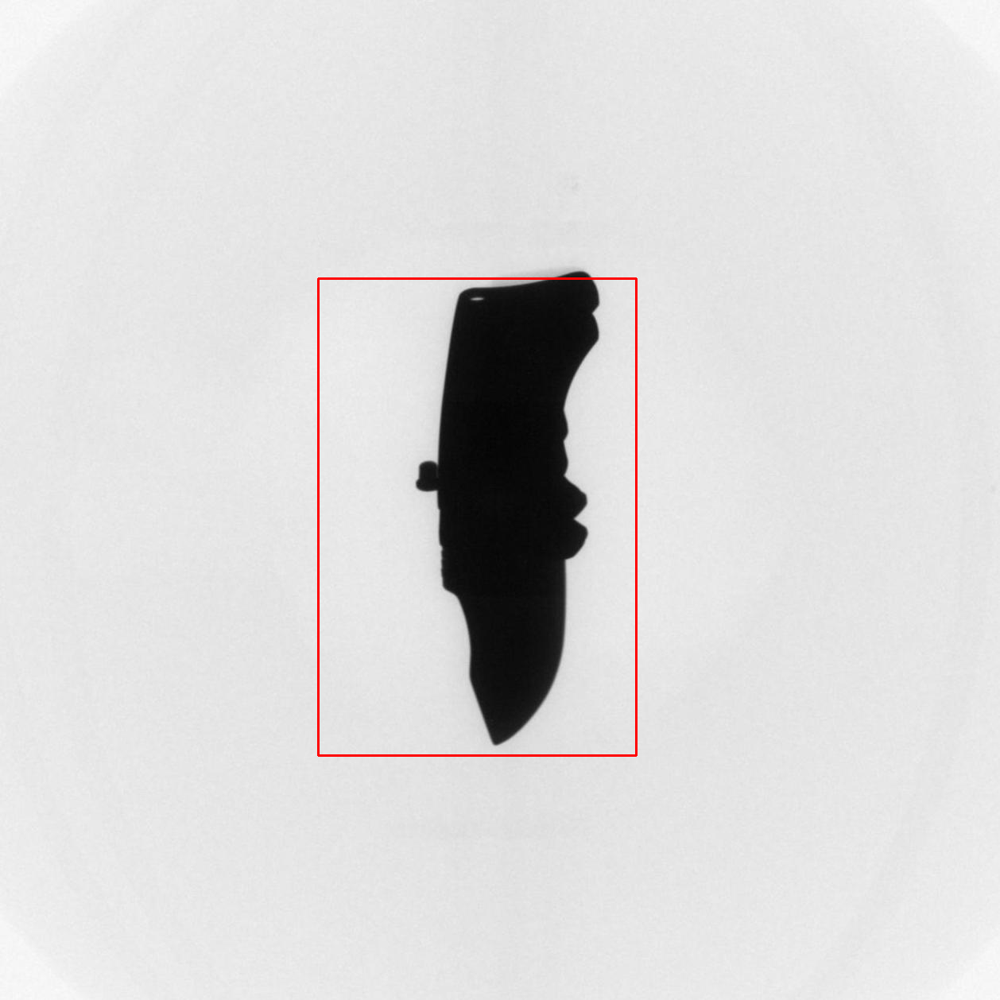

In [ ]:
import cv2 as cv
import numpy as np


# assuming you have the code for opening and processing the image
# here is a sample image for testingp
image = cv.imread('/content/drive/MyDrive/data/test/knife/B0077_0199.png')

if image is None:
    print("Error: Unable to open the image.")
elif np.any(np.array(image.shape) <= 0):
    print("Error: Invalid image dimensions.")
else:
   # Define the bounding box coordinates (x, y, width, height)
    x = 400
    y = 350

    width = 400
    height = 600

    # Draw the bounding box on the image
    cv.rectangle(image, (x, y), (x + width, y + height), (0, 0, 255), 2)

from google.colab.patches import cv2_imshow
cv2_imshow(image)
cv.waitKey(0)
cv.destroyAllWindows()

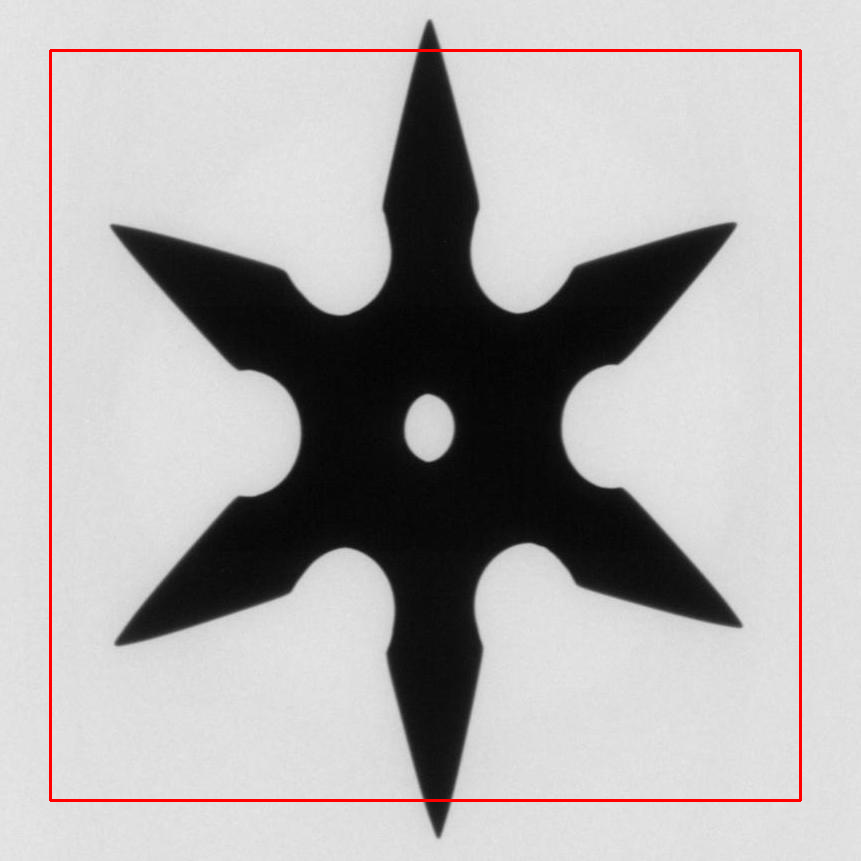

In [ ]:
import cv2 as cv
import numpy as np


# assuming you have the code for opening and processing the image
# here is a sample image for testingp
image = cv.imread('/content/drive/MyDrive/data/test/sharb tool/B0050_0064.png')

if image is None:
    print("Error: Unable to open the image.")
elif np.any(np.array(image.shape) <= 0):
    print("Error: Invalid image dimensions.")
else:
   # Define the bounding box coordinates (x, y, width, height)
    x = 50
    y = 50

    width = 750
    height = 750

    # Draw the bounding box on the image
    cv.rectangle(image, (x, y), (x + width, y + height), (0, 0, 255), 2)

from google.colab.patches import cv2_imshow
cv2_imshow(image)
cv.waitKey(0)
cv.destroyAllWindows()

In [ ]:
!gdown https://www.lrt.lt/img/2020/04/22/641958-441288-756x425.jpg -O "index.jpg"

Downloading...
From: https://www.lrt.lt/img/2020/04/22/641958-441288-756x425.jpg
To: /content/drive/MyDrive/data/test/knife/B0077_0173.png
100% 67.5k/67.5k [00:00<00:00, 277kB/s]


In [ ]:
import torch
from torchvision.ops import nms


boxes = torch.tensor([[190,380,(190+300),(380+150)],
                      [300,420,(300+150),(420+210)],
                      [320,360,(320+200),(360+230)],

                      [390,50,(390+300),(50+330)],
                      [490,45,(490+200),(45+500)],
                      [480,130,(480+150),(130+400)]], dtype=torch.float32)

scores = torch.tensor([0.90,0.98,0.82, 0.87,0.98,0.82], dtype=torch.float32)

nms(boxes = boxes, scores = scores, iou_threshold=0.2)

tensor([1, 4])

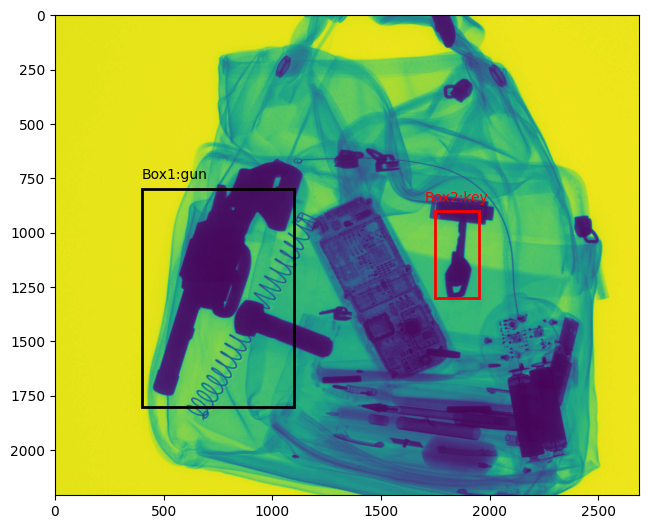

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

image = plt.imread('/content/drive/MyDrive/Baggages/B0044/B0044_0119.png')

# draw emtpy figure
fig = plt.figure()

# define axis
ax = fig.add_axes([0, 0, 1, 1])

# plot image
plt.imshow(image)

# create rectangular patch
rect_1 = patches.Rectangle((400, 800), 700, 1000, edgecolor='black', facecolor='none', linewidth=2)
rect_4 = patches.Rectangle((1750, 900), 200, 400, edgecolor='red', facecolor='none', linewidth=2)

# add patch
ax.add_patch(rect_1)
ax.text(400, 750, 'Box1:gun', color='black')

ax.add_patch(rect_4)
ax.text(1700, 860, 'Box2:key', color='red')


# show figure
plt.show()